In [1]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [2]:
data_dir = '/kaggle/input/skin-diseases-image-dataset'
img_size = 224
max_images_per_class = 500

# Placeholder for data and labels
X = []
y = []
sample_images = {}

In [3]:
classes = [
    'IMG_CLASSES/1. Eczema 1677',
    'IMG_CLASSES/10. Warts Molluscum and other Viral Infections - 2103',
    'IMG_CLASSES/2. Melanoma 15.75k',
    'IMG_CLASSES/3. Atopic Dermatitis - 1.25k',
    'IMG_CLASSES/4. Basal Cell Carcinoma (BCC) 3323',
    'IMG_CLASSES/5. Melanocytic Nevi (NV) - 7970',
    'IMG_CLASSES/6. Benign Keratosis-like Lesions (BKL) 2624',
    'IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k',
    'IMG_CLASSES/8. Seborrheic Keratoses and other Benign Tumors - 1.8k',
    'IMG_CLASSES/9. Tinea Ringworm Candidiasis and other Fungal Infections - 1.7k'
    ]

In [4]:
# Load images and prepare dataset
for class_idx, class_name in enumerate(classes):
    class_dir = os.path.join(data_dir, class_name)
    class_images = random.sample(os.listdir(class_dir), max_images_per_class)
    
    for i, img_name in enumerate(class_images):
        img_path = os.path.join(class_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (img_size, img_size))
        X.append(img)
        y.append(class_idx)
        
        # Save one image per class for displaying augmentation steps
        if i == 0:
            sample_images[class_name] = img

# Convert to numpy arrays
X = np.array(X)
y = np.array(y)

Class: IMG_CLASSES/1. Eczema 1677
Class: IMG_CLASSES/10. Warts Molluscum and other Viral Infections - 2103
Class: IMG_CLASSES/2. Melanoma 15.75k
Class: IMG_CLASSES/3. Atopic Dermatitis - 1.25k
Class: IMG_CLASSES/4. Basal Cell Carcinoma (BCC) 3323
Class: IMG_CLASSES/5. Melanocytic Nevi (NV) - 7970
Class: IMG_CLASSES/6. Benign Keratosis-like Lesions (BKL) 2624
Class: IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k
Class: IMG_CLASSES/8. Seborrheic Keratoses and other Benign Tumors - 1.8k
Class: IMG_CLASSES/9. Tinea Ringworm Candidiasis and other Fungal Infections - 1.7k


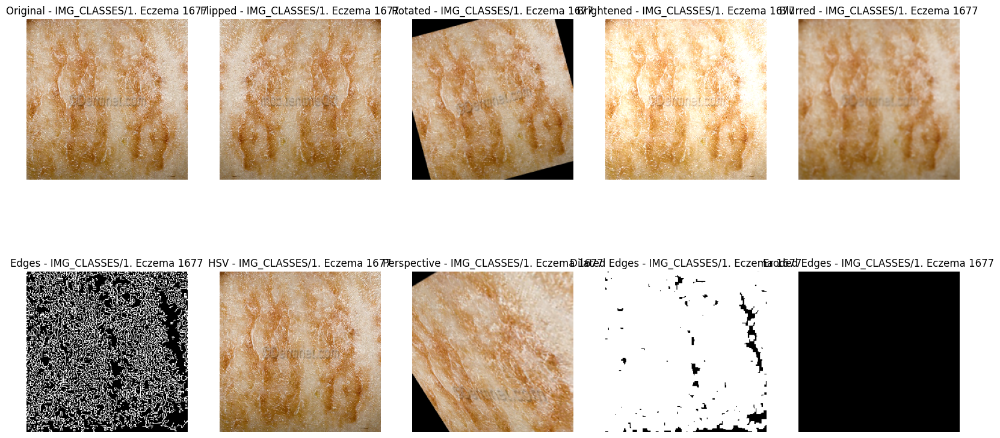

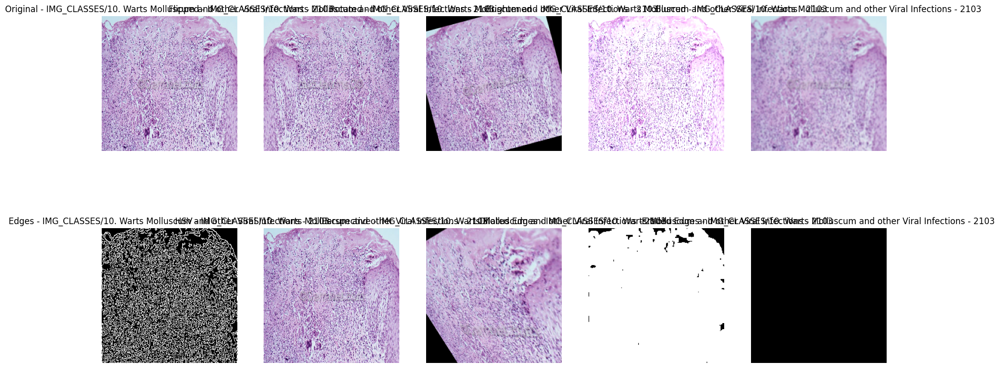

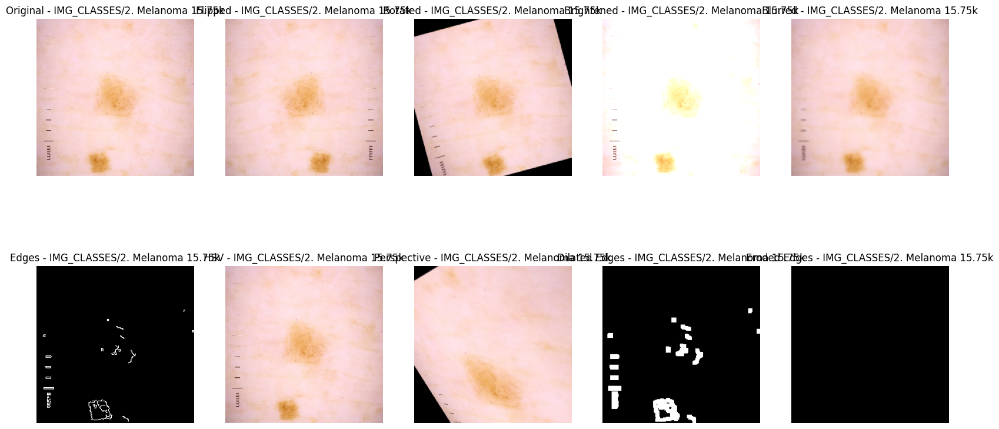

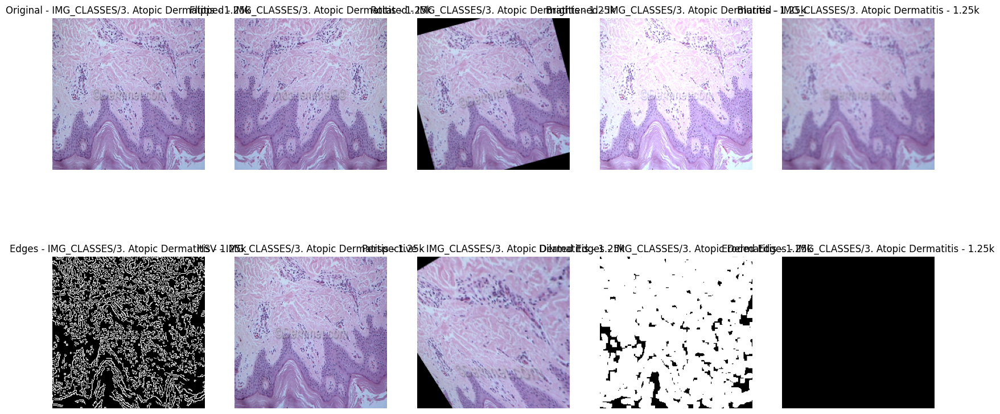

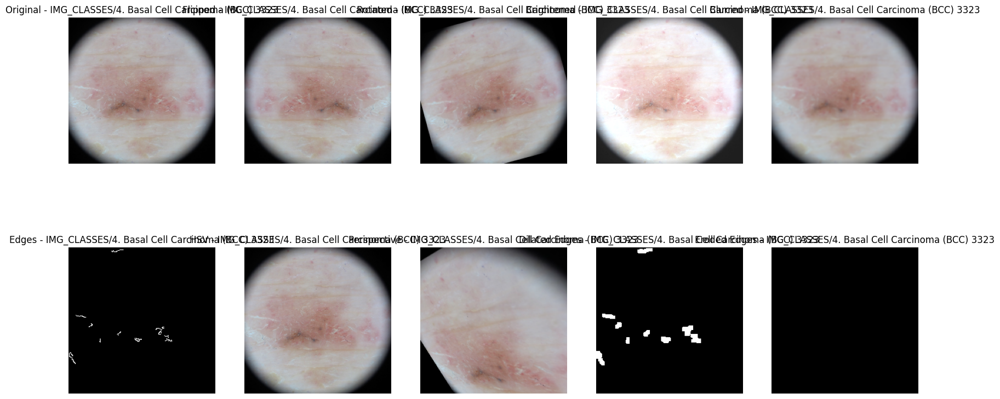

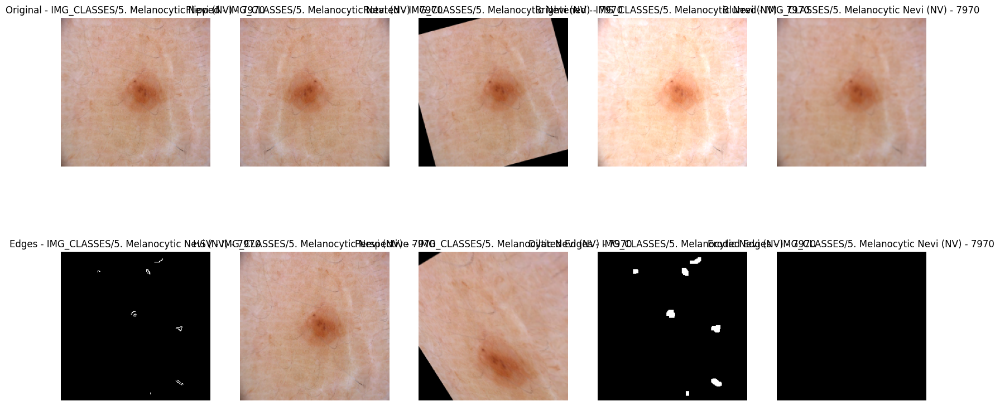

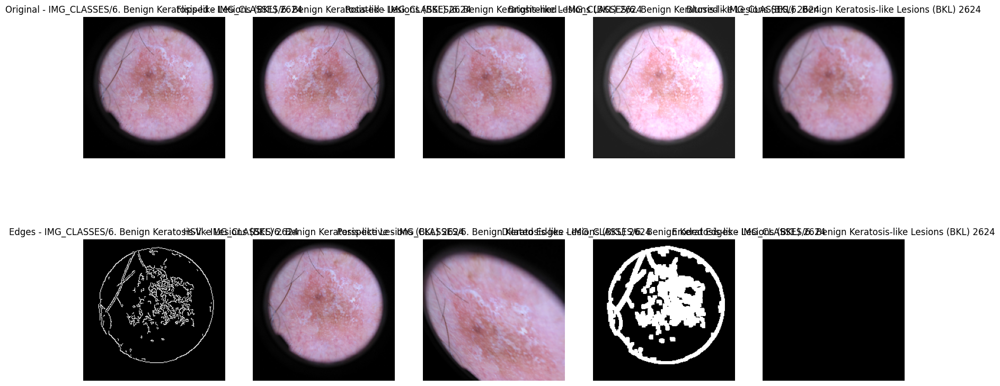

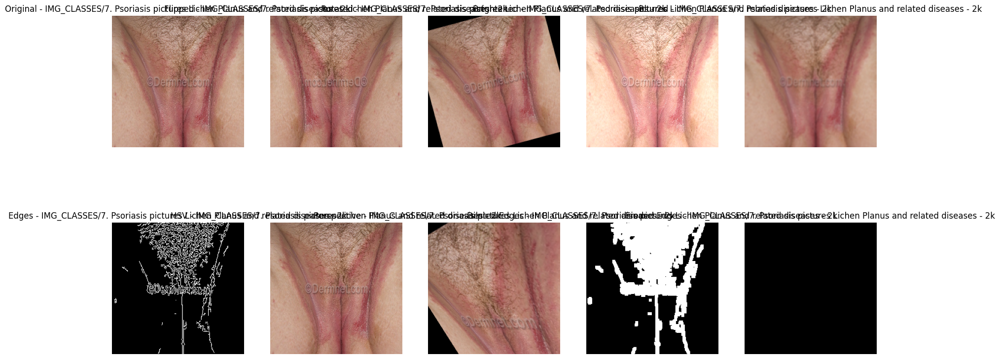

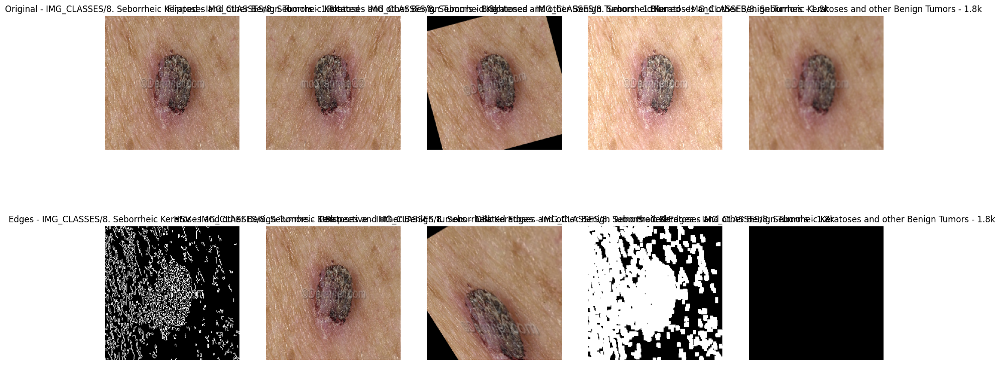

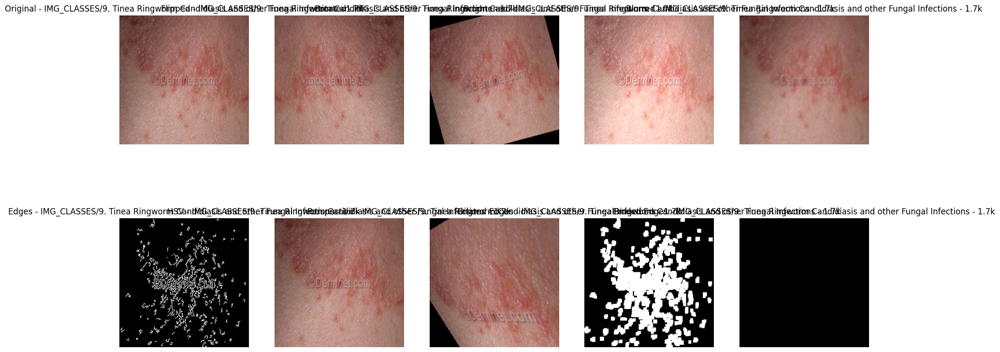

In [5]:
# 3. Display Augmented Images with CV Operations
for class_name, img in sample_images.items():
    print(f"Class: {class_name}")
    
    # Display original image
    plt.figure(figsize=(20, 10))
    
    # 1. Original Image
    plt.subplot(2, 5, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Original - {class_name}")
    plt.axis('off')

    # 2. Flipped Image
    flipped_img = cv2.flip(img, 1)
    plt.subplot(2, 5, 2)
    plt.imshow(cv2.cvtColor(flipped_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Flipped - {class_name}")
    plt.axis('off')
# 3. Rotated Image
    h, w = img.shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((w // 2, h // 2), 15, 1)
    rotated_img = cv2.warpAffine(img, rotation_matrix, (w, h))
    plt.subplot(2, 5, 3)
    plt.imshow(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Rotated - {class_name}")
    plt.axis('off')

    # 4. Brightness Adjustment
    bright_img = cv2.convertScaleAbs(img, alpha=1.2, beta=30)
    plt.subplot(2, 5, 4)
    plt.imshow(cv2.cvtColor(bright_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Brightened - {class_name}")
    plt.axis('off')

    # 5. Gaussian Blur
    blurred_img = cv2.GaussianBlur(img, (5, 5), 0)
    plt.subplot(2, 5, 5)
    plt.imshow(cv2.cvtColor(blurred_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Blurred - {class_name}")
    plt.axis('off')

    # 6. Canny Edge Detection
    edges_img = cv2.Canny(img, 100, 200)
    plt.subplot(2, 5, 6)
    plt.imshow(edges_img, cmap='gray')
    plt.title(f"Edges - {class_name}")
    plt.axis('off')

    # 7. Color Conversion to HSV
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    plt.subplot(2, 5, 7)
    plt.imshow(cv2.cvtColor(hsv_img, cv2.COLOR_HSV2RGB))
    plt.title(f"HSV - {class_name}")
    plt.axis('off')

    # 8. Perspective Transformation
    pts1 = np.float32([[50,50],[200,50],[50,200],[200,200]])
    pts2 = np.float32([[10,100],[200,50],[100,250],[300,300]])
    matrix = cv2.getPerspectiveTransform(pts1, pts2)
    perspective_img = cv2.warpPerspective(img, matrix, (img_size, img_size))
    plt.subplot(2, 5, 8)
    plt.imshow(cv2.cvtColor(perspective_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Perspective - {class_name}")
    plt.axis('off')

    # 9. Dilation
    kernel = np.ones((5, 5), np.uint8)
    dilated_img = cv2.dilate(edges_img, kernel, iterations=1)
    plt.subplot(2, 5, 9)
    plt.imshow(dilated_img, cmap='gray')
    plt.title(f"Dilated Edges - {class_name}")
    plt.axis('off')

    # 10. Erosion
    eroded_img = cv2.erode(edges_img, kernel, iterations=1)
    plt.subplot(2, 5, 10)
    plt.imshow(eroded_img, cmap='gray')
    plt.title(f"Eroded Edges - {class_name}")
    plt.axis('off')

plt.show()


In [6]:
# 4. Normalize and One-Hot Encode Labels
X = X / 255.0
y = to_categorical(y, len(classes))

# 5. Split Dataset into Train and Test Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 6. Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=15,  # Reduced to make transformations less aggressive
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1
)
datagen.fit(X_train)

# 7. CNN Model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(img_size, img_size, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))  # Reduced dropout to retain more information

model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))  # Maintain higher dropout in deeper layers to prevent overfitting

model.add(Flatten())
model.add(Dense(128, activation='relu', kernel_regularizer='l2'))  # L2 regularization added
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(len(classes), activation='softmax'))

# Compile the model with an adjusted learning rate
optimizer = Adam(learning_rate=0.0005)  # Reduced learning rate for better convergence
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# 8. Callbacks for Improved Training
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
early_stopping = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)

# 9. Train the Model with Data Augmentation
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    epochs=50,
    validation_data=(X_test, y_test),
    callbacks=[reduce_lr, early_stopping]
)

# 10. Evaluate the Model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1730643203.418814     112 service.cc:145] XLA service 0x7805bc006ba0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730643203.418895     112 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  1/125 ━━━━━━━━━━━━━━━━━━━━ 33:44 16s/step - accuracy: 0.1250 - loss: 6.4481

I0000 00:00:1730643214.115087     112 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


125/125 ━━━━━━━━━━━━━━━━━━━━ 57s 328ms/step - accuracy: 0.2299 - loss: 5.8122 - val_accuracy: 0.0940 - val_loss: 16.4959 - learning_rate: 5.0000e-04
Epoch 2/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 41s 308ms/step - accuracy: 0.2775 - loss: 4.3167 - val_accuracy: 0.0960 - val_loss: 7.9964 - learning_rate: 5.0000e-04
Epoch 3/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 41s 310ms/step - accuracy: 0.3157 - loss: 3.6161 - val_accuracy: 0.1300 - val_loss: 4.9443 - learning_rate: 5.0000e-04
Epoch 4/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.3334 - loss: 3.1551 - val_accuracy: 0.2250 - val_loss: 3.6174 - learning_rate: 5.0000e-04
Epoch 5/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.3544 - loss: 2.9358 - val_accuracy: 0.3270 - val_loss: 2.9739 - learning_rate: 5.0000e-04
Epoch 6/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 40s 301ms/step - accuracy: 0.3673 - loss: 2.8123 - val_accuracy: 0.2620 - val_loss: 2.9802 - learning_rate: 5.0000e-04
Epoch 7/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 41s 307ms/step -